### Import packages

In [1]:
import osmnx as ox
import networkx as nx
import numpy as np
import pandas as pd
import geopandas as gpd
import random
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from shapely.geometry import Point
from shapely.ops import transform
from scipy.spatial import cKDTree
from itertools import cycle
import pyproj
from pathlib import Path
import osmnx as ox
import math
import matplotlib.pyplot as plt
import random
import geopandas as gpd
import folium
from pathlib import Path


### Load barrios y puntos CID

In [2]:
def cargar_geojson(nombre_archivo, directorio_base='../../../../data/delivetter'):
    """
    Carga un archivo GeoJSON específico y devuelve un GeoDataFrame.
    
    Args:
        nombre_archivo (str): Nombre del archivo GeoJSON (ej. 'barris.geojson').
        directorio_base (str): Ruta relativa al directorio donde se encuentra el archivo.
                              Por defecto: '../../data/delivetter'.
    
    Returns:
        gpd.GeoDataFrame: GeoDataFrame con los datos del archivo.
        None: Si el archivo no existe o hay un error.
    """
    try:
        ruta = Path(directorio_base) / nombre_archivo
        
        if not ruta.exists():
            raise FileNotFoundError(f"Archivo no encontrado: {ruta.absolute()}")
        
        gdf = gpd.read_file(ruta)
        print(f"✅ '{nombre_archivo}' cargado correctamente ({len(gdf)} registros)")
        return gdf
    
    except Exception as e:
        print(f"❌ Error al cargar '{nombre_archivo}': {str(e)}")
        return None
    
barrios = cargar_geojson('barris.geojson')
catastro = cargar_geojson('catastro.geojson')
puntos_carga = cargar_geojson('puntosCID.geojson')

✅ 'barris.geojson' cargado correctamente (88 registros)
✅ 'catastro.geojson' cargado correctamente (36346 registros)
✅ 'puntosCID.geojson' cargado correctamente (885 registros)


### Functions

In [3]:
def get_graph(request):
    shp_neighbourhood = barrios[barrios["nombre"].str.upper().str.contains(request.strip().upper())]
    while len(shp_neighbourhood) != 1:
        request = input("Please, introduce a valid neighbourhood: ")
        shp_neighbourhood = barrios[barrios["nombre"].str.upper().str.contains(request.strip().upper())]
    shp_zone = shp_neighbourhood["geometry"].values[0]
    shp_loading_points = puntos_carga[puntos_carga.intersects(shp_zone)]
    shp_bajos = catastro[catastro.intersects(shp_zone)]

    G = ox.graph_from_polygon(shp_zone, 
                              network_type="all_public",  
                              simplify=False, 
                              retain_all=False,  
                              truncate_by_edge=True) 
    not_highway = ['elevator', 'busway', 'corridor', 'unclassified', 'services', 'cycleway', 'steps', 'service']

    allowed_vehicle = ['motorway', 'residential', 'secondary', 'living_street',
                    'primary_link', 'primary', 'tertiary', 'trunk', 'service',
                    'tertiary_link', 'trunk_link', 'secondary_link', 'motorway_link', 'road']
    
    allowed_pedestrian = ["pedestrian", "footway", "path", "track", "bridleway", "living_street", "residential"]
    edges_to_remove = [(u, v, k) for u, v, k, data in G.edges(keys=True, data=True) 
                   if data.get('highway') in not_highway or data.get('access') in ['private', 'no', 'customers']]
    G.remove_edges_from(edges_to_remove)

    G_vehicle = G.copy()  
    edges_to_remove_vehicle = [(u, v, k) for u, v, k, data in G_vehicle.edges(keys=True, data=True) 
                                   if data.get('highway') not in allowed_vehicle]
    G_vehicle.remove_edges_from(edges_to_remove_vehicle)
    
    G_pedestrian = G.copy()  
    edges_to_remove_pedestrian = [(u, v, k) for u, v, k, data in G_pedestrian.edges(keys=True, data=True) 
                                      if data.get('highway') not in allowed_pedestrian]
    G_pedestrian.remove_edges_from(edges_to_remove_pedestrian)

    for graph in [G_vehicle, G_pedestrian]:
        nodes_to_remove = [node for node in graph.nodes if graph.degree(node) == 0]
        graph.remove_nodes_from(nodes_to_remove)

    for u, v, k, data in G_pedestrian.edges(keys=True, data=True):
        data['oneway'] = False


    print(f"Grafo para vehículos: {len(G_vehicle.nodes)} nodos, {len(G_vehicle.edges)} aristas")
    print(f"Grafo para peatones: {len(G_pedestrian.nodes)} nodos, {len(G_pedestrian.edges)} aristas")
    

    fig, ax = plt.subplots(2,1, figsize=(20, 15))
    
    ax[0].set_title("Grafo para vehículos")
    ox.plot_graph(G_vehicle, ax=ax[0], node_size=3, node_color='green', 
                  edge_linewidth=0.5, edge_color='blue', bgcolor="white", show=False)

    ax[1].set_title("Grafo para peatones")
    ox.plot_graph(G_pedestrian, ax=ax[1], node_size=3, node_color='green', 
                  edge_linewidth=0.5, edge_color='red', bgcolor="white", show=False)
    
    plt.show()
    
    return G_vehicle, G_pedestrian, shp_zone, shp_loading_points, shp_bajos
    


def graph_map(G_vehicle, G_pedestrian, shp_zone, shp_loading_points, bajos):
    mapa = folium.Map(location=[shp_zone.centroid.y, shp_zone.centroid.x], zoom_start=16)

    gdf_edges_vehicle = ox.graph_to_gdfs(G_vehicle, nodes=False, edges=True)
    gdf_edges_pedestrian = ox.graph_to_gdfs(G_pedestrian, nodes=False, edges=True)

    bajos_in_zone = bajos[bajos.intersects(shp_zone)]

    folium.GeoJson(
        shp_zone,  
        style_function=lambda feature: {
            "color": "green", 
            "weight": 6,  
            "fill": True,  
            "fillColor": "limegreen",  
            "fillOpacity": 0.2  
        }
    ).add_to(mapa)
    
    def add_edges_with_popup(gdf_edges, color, group_name):
        for _, row in gdf_edges.iterrows():
            if row["geometry"].geom_type == "LineString":
                popup_text = f"<b>Tipo:</b> {row.get('highway', 'N/A')}<br>"
                popup_text += f"<b>Nombre:</b> {row.get('name', 'Sin nombre')}<br>"
                popup_text += f"<b>Longitud:</b> {round(row.get('length', 0), 1)} m"

                folium.GeoJson(
                    row["geometry"],
                    name=group_name,
                    style_function=lambda feature, col=color: {
                        'color': col,
                        'weight': 2,
                        'opacity': 1
                    },
                    tooltip=popup_text
                ).add_to(mapa)
    add_edges_with_popup(gdf_edges_pedestrian, "red", "Peatones")
    add_edges_with_popup(gdf_edges_vehicle, "blue", "Vehículos")
    

    

    shp_loading_points.apply(lambda row: folium.CircleMarker(
        location=[row.geometry.centroid.y, row.geometry.centroid.x], 
        radius=8,  
        color="black",  
        fill=True,
        fill_color="orange",  
        fill_opacity=1, 
        popup=row.get("NOMBRE", "Punto de carga")
    ).add_to(mapa), axis=1)

    # Puntos bajos
    for _, row in bajos_in_zone.iterrows():
        if not row['Almacen'] and not row['Comercio']:
            continue

        centroide = row.geometry.centroid
        if row['Almacen'] and row['Comercio']:
            fill_color = 'black'
            tipo = "Almacén y Comercio"
        elif row['Almacen']:
            fill_color = 'purple'
            tipo = "Almacén"
        elif row['Comercio']:
            fill_color = 'lightblue'
            tipo = "Comercio"

        folium.CircleMarker(
            location=[centroide.y, centroide.x],
            radius=8,
            color='black',
            fill=True,
            fill_color=fill_color,
            fill_opacity=1,
            popup=tipo
        ).add_to(mapa)

    legend_html = '''
                <div style="position: fixed; 
                            bottom: 50px; left: 50px; width: 250px; height: 130px; 
                            background-color: white; z-index:9999; font-size:13px;
                            border:1px solid grey; border-radius: 5px; padding: 8px;
                            box-shadow: 2px 2px 5px rgba(0,0,0,0.2);">
                    <b style="font-size:14px;">Leyenda</b> <br>
                    <i class="fa fa-circle" style="color:black; margin-right:5px;"></i> Almacén y Comercio <br>
                    <i class="fa fa-circle" style="color:orange; margin-right:5px;"></i> Punto CID (origen M1) <br>
                    <i class="fa fa-circle" style="color:purple; margin-right:5px;"></i> Almacén (origen M3) <br>
                    <i class="fa fa-circle" style="color:lightblue; margin-right:5px;"></i> Comercio (entrega) <br>
                    <i class="fa fa-square" style="color:limegreen; margin-right:5px;"></i> Barrio
                </div>
                '''
    mapa.get_root().html.add_child(folium.Element(legend_html))
    
    return mapa




### Get the graph

| FAVARA               | BENICALAP             | SANT PAU                 | BORBOTO                  | BENIFARAIG               |
|----------------------|----------------------|--------------------------|--------------------------|--------------------------|
| CAMI REAL           | JAUME ROIG            | LA SEU                   | AIORA                    | TORMOS                   |
| LA FONTETA S.LLUIS  | LA PETXINA            | L'HORT DE SENABRE        | CIUTAT JARDI             | CAMI DE VERA             |
| LA PUNTA            | SANT MARCEL.LI        | FAITANAR                 | PINEDO                   | CASTELLAR-L'OLIVERAL     |
| BENIMAMET           | EL FORN D'ALCEDO      | MONTOLIVET               | CIUTAT DE LES ARTS I DE LES CIENCIES | NA ROVELLA             |
| SANT LLORENS        | NATZARET              | LA CREU COBERTA          | L'AMISTAT                | EL GRAU                  |
| CIUTAT FALLERA      | RAFALELL-VISTABELLA   | LA CARRASCA              | BENIFERRI                | EL SALER                 |
| NOU MOLES           | MORVEDRE              | TRINITAT                 | CAMPANAR                 | EL CARME                 |
| LA LLUM             | LA VEGA BAIXA         | LA XEREA                 | L'ILLA PERDUDA           | TRES FORQUES             |
| LA MALVA-ROSA       | EL MERCAT             | LA ROQUETA               | LA GRAN VIA              | CAMI FONDO               |
| EL CALVARI          | LA RAIOSA             | SAFRANAR                 | SANT ISIDRE              | MALILLA                  |
| LES TENDETES        | PATRAIX               | RUSSAFA                  | LA CREU DEL GRAU         | LES CASES DE BARCENA     |
| CIUTAT UNIVERSITARIA | MAHUELLA-TAULADELLA  | MASSARROJOS              | CARPESA                  | TORREFIEL                |
| EL BOTANIC          | SANT ANTONI           | BENIMACLET               | MARXALENES               | EXPOSICIO                |
| BETERO              | CABANYAL-CANYAMELAR   | MESTALLA                 | EL PILAR                 | EL PLA DEL REMEI         |
| ALBORS              | ARRANCAPINS           | EN CORTS                 | POBLE NOU                | LA TORRE                 |
| SANT FRANCESC       | PENYA-ROJA            | ELS ORRIOLS              | VARA DE QUART            | SOTERNES                 |
| LA FONTSANTA        | EL PERELLONET         | EL PALMAR                | LA XEREA                 | L'ILLA PERDUDA           |


Grafo para vehículos: 440 nodos, 476 aristas
Grafo para peatones: 1340 nodos, 2876 aristas


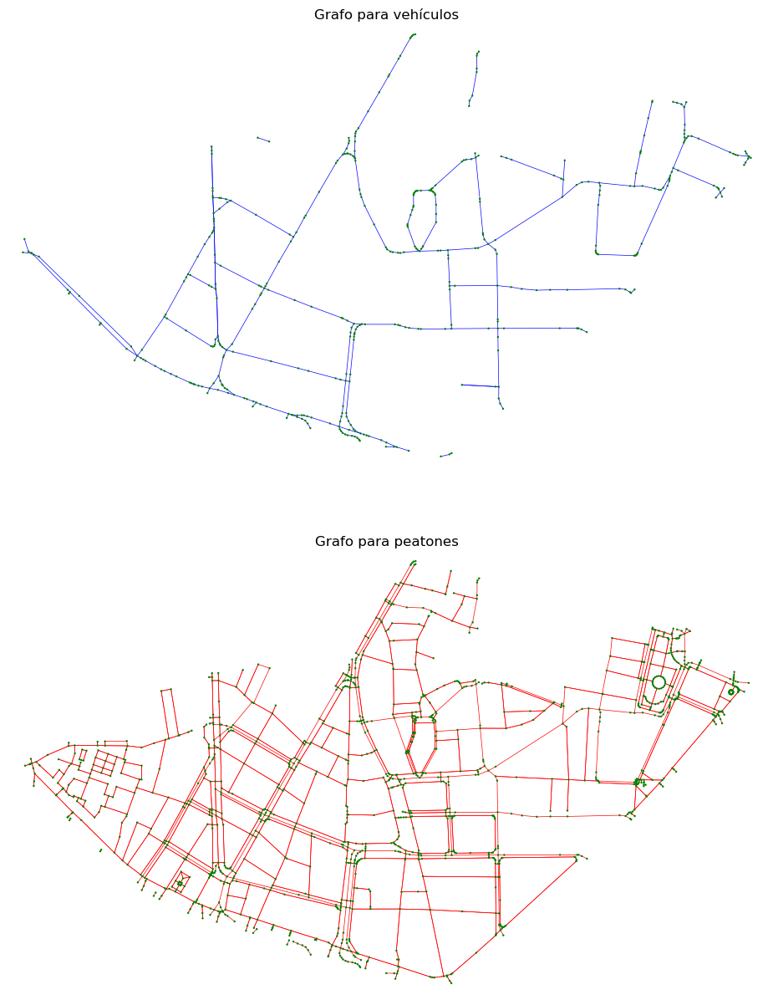

In [4]:
G_drive, G_walk, shp_zone, shp_loading_points, shp_bajos= get_graph('Sant Francesc')
graph_map(G_drive, G_walk, shp_zone, shp_loading_points, shp_bajos)

In [5]:

# ==============================
# 1. Crear el supergrafo fusionando aristas
# ==============================

G_super = nx.MultiDiGraph()

# Agregar todos los nodos
G_super.add_nodes_from(G_drive.nodes(data=True))
G_super.add_nodes_from(G_walk.nodes(data=True))

# Función para añadir o fusionar aristas
def add_or_merge_edge(G, u, v, k, data, mode):
    data = data.copy()
    if 'mode' in data:
        current_mode = data['mode']
        if not isinstance(current_mode, list):
            data['mode'] = [current_mode]
    else:
        data['mode'] = []

    if mode not in data['mode']:
        data['mode'].append(mode)

    # Verifica si ya existe una arista idéntica en términos de u-v
    exists = False
    for key_existing in G[u][v] if G.has_edge(u, v) else []:
        existing_data = G[u][v][key_existing]
        if existing_data.get('geometry') == data.get('geometry'):
            # Fusionar modos
            if 'mode' in existing_data:
                for m in data['mode']:
                    if m not in existing_data['mode']:
                        existing_data['mode'].append(m)
            else:
                existing_data['mode'] = data['mode']
            exists = True
            break

    if not exists:
        G.add_edge(u, v, key=k, **data)

# Añadir aristas de G_drive
for u, v, k, data in G_drive.edges(keys=True, data=True):
    add_or_merge_edge(G_super, u, v, k, data, 'drive')

# Añadir aristas de G_walk
for u, v, k, data in G_walk.edges(keys=True, data=True):
    add_or_merge_edge(G_super, u, v, k, data, 'walk')
    if not G_walk.has_edge(v, u):
        add_or_merge_edge(G_super, v, u, k, data, 'walk')
    

# ==============================
# 2. Preparar k-d trees para búsquedas rápidas
# ==============================

G_drive_proj = ox.project_graph(G_drive)
G_walk_proj = ox.project_graph(G_walk)

nodes_drive = ox.graph_to_gdfs(G_drive_proj, edges=False)
nodes_walk = ox.graph_to_gdfs(G_walk_proj, edges=False)

coords_drive = np.vstack((nodes_drive['x'], nodes_drive['y'])).T
coords_walk = np.vstack((nodes_walk['x'], nodes_walk['y'])).T

kdtree_drive = cKDTree(coords_drive)
kdtree_walk = cKDTree(coords_walk)

index_to_node_drive = np.array(nodes_drive.index)
index_to_node_walk = np.array(nodes_walk.index)

project_geom = pyproj.Transformer.from_crs("EPSG:4326", nodes_drive.crs, always_xy=True).transform

# ==============================
# 3. Añadir nodos especiales
# ==============================

def add_special_node(G, geom, tipo, id_):
    nodo_id = f"{tipo}_{id_}"
    G.add_node(nodo_id, x=geom.centroid.x, y=geom.centroid.y, tipo=tipo)

    geom_proj = transform(project_geom, geom.centroid)
    x, y = geom_proj.x, geom_proj.y

    if tipo == "carga":
        dist, idx = kdtree_drive.query([x, y])
        nearest = index_to_node_drive[idx]
    else:
        dist, idx = kdtree_walk.query([x, y])
        nearest = index_to_node_walk[idx]

    G.add_edge(nodo_id, nearest, mode=['connection'], length=dist)
    G.add_edge(nearest, nodo_id, mode=['connection'], length=dist)

    return nodo_id

# ==============================
# 4. Añadir todos los nodos especiales
# ==============================

nodos_carga = []
for i, row in shp_loading_points.iterrows():
    nodo = add_special_node(G_super, row.geometry, "carga", i)
    nodos_carga.append(nodo)

nodos_comercios = []
for i, row in shp_bajos[shp_bajos['Comercio'] == True].iterrows():
    nodo = add_special_node(G_super, row.geometry, "comercio", i)
    nodos_comercios.append(nodo)

nodos_almacenes = []
for i, row in shp_bajos[shp_bajos['Almacen'] == True].iterrows():
    nodo = add_special_node(G_super, row.geometry, "almacen", i)
    nodos_almacenes.append(nodo)

print(f"✅ Supergrafo creado con {len(G_super.nodes)} nodos y {len(G_super.edges)} aristas.")


✅ Supergrafo creado con 1743 nodos y 4053 aristas.


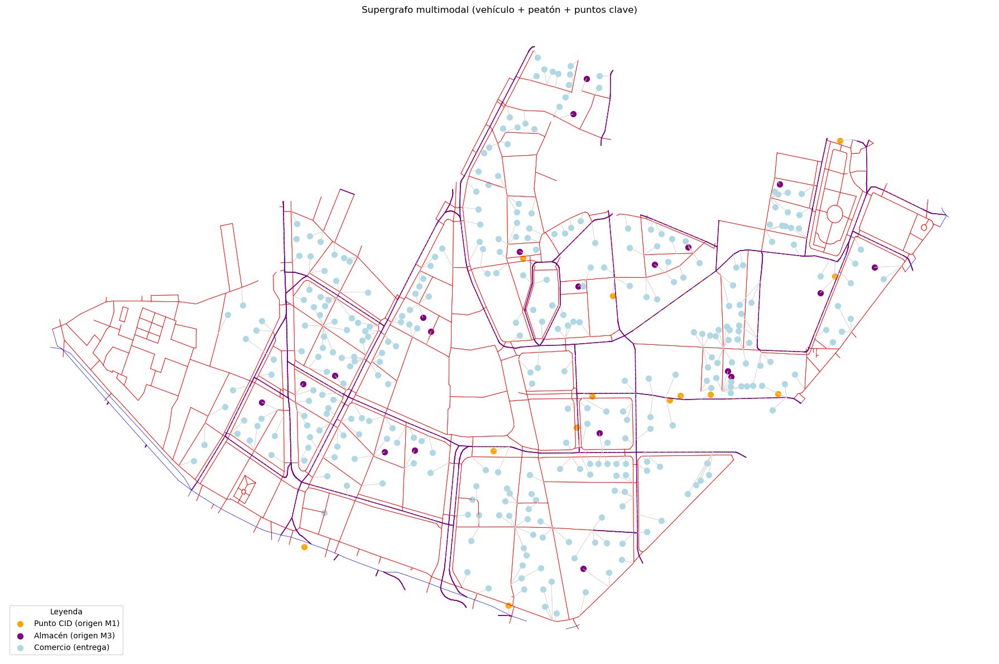

In [6]:

# ==========================
# Visualización del supergrafo con leyenda personalizada
# ==========================

fig, ax = plt.subplots(figsize=(18, 12))

# ==========================
# 1. Pintar aristas por tipo
# ==========================

# Colores por modo
edge_colors = {
    'drive': 'blue',
    'walk': 'red',
    'drive+walk': 'green',
    'connection': 'lightgray'
}

# Organizar aristas por tipo (clave: modo, valor: lista de segmentos)
edges_by_mode = {
    'drive': [],
    'walk': [],
    'drive+walk': [],
    'connection': []
}

for u, v, data in G_super.edges(data=True):
    mode = data.get('mode', 'connection')

    if isinstance(mode, list):
        if sorted(mode) == ['drive', 'walk']:
            mode_key = 'drive+walk'
        elif 'drive' in mode:
            mode_key = 'drive'
        elif 'walk' in mode:
            mode_key = 'walk'
        else:
            mode_key = 'connection'
    else:
        mode_key = mode

    x0, y0 = G_super.nodes[u]['x'], G_super.nodes[u]['y']
    x1, y1 = G_super.nodes[v]['x'], G_super.nodes[v]['y']
    edges_by_mode[mode_key].append(([x0, x1], [y0, y1]))

# Pintar las líneas por modo
for mode_key, lines in edges_by_mode.items():
    for x_vals, y_vals in lines:
        if mode_key == 'drive+walk':
            # Dibujar segmentos cortos alternando rojo y azul
            x0, x1 = x_vals
            y0, y1 = y_vals
            num_segments = 20  # Cuántos tramos alternar
            xs = np.linspace(x0, x1, num_segments + 1)
            ys = np.linspace(y0, y1, num_segments + 1)

            for i in range(num_segments):
                color = 'red' if i % 2 == 0 else 'blue'
                ax.plot([xs[i], xs[i + 1]], [ys[i], ys[i + 1]], color=color, linewidth=1, linestyle='-')
        else:
            ax.plot(x_vals, y_vals, color=edge_colors[mode_key], linewidth=0.5)


# ==========================
# 2. Pintar nodos según leyenda
# ==========================

categorias = {
    'cid': {'coords': [], 'color': 'orange', 'label': 'Punto CID (origen M1)'},
    'almacen_m3': {'coords': [], 'color': 'purple', 'label': 'Almacén (origen M3)'},
    'comercio_entrega': {'coords': [], 'color': 'lightblue', 'label': 'Comercio (entrega)'},
    'almacen_y_comercio': {'coords': [], 'color': 'black', 'label': 'Almacén y Comercio'},
}

for nodo, data in G_super.nodes(data=True):
    if isinstance(nodo, str):
        tipo = data.get('tipo')
        if tipo == 'carga':
            categorias['cid']['coords'].append((data['x'], data['y']))
        elif tipo == 'almacen' and 'comercio' in nodo:
            categorias['almacen_y_comercio']['coords'].append((data['x'], data['y']))
        elif tipo == 'almacen':
            categorias['almacen_m3']['coords'].append((data['x'], data['y']))
        elif tipo == 'comercio':
            categorias['comercio_entrega']['coords'].append((data['x'], data['y']))

# Pintar nodos especiales
for cat in categorias.values():
    if cat['coords']:
        xs, ys = zip(*cat['coords'])
        ax.scatter(xs, ys, color=cat['color'], s=50, label=cat['label'])

# ==========================
# 3. Estilo y leyenda
# ==========================

ax.set_title("Supergrafo multimodal (vehículo + peatón + puntos clave)")
ax.axis('off')

# Leyenda sin duplicados
handles, labels = ax.get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax.legend(by_label.values(), by_label.keys(), loc='lower left', title='Leyenda')

plt.tight_layout()
plt.show()


In [7]:

# ==============================
# CONFIGURACIÓN
# ==============================

N_CID = 2
N_COMERCIOS = 20
PAQUETES_MIN = 1
PAQUETES_MAX = 5
CAPACIDAD_MAXIMA = 10  # Paquetes que puede llevar en la mano el repartidor
VELOCIDAD_VEHICULO = 20  # km/h
VELOCIDAD_PEATON = 5     # km/h

# ==============================
# 1. Seleccionar comercios y asignar paquetes
# ==============================

bajos_sample = random.sample(nodos_comercios, k=min(N_COMERCIOS, len(nodos_comercios)))
df = pd.DataFrame([{'nodo': n, **G_super.nodes[n]} for n in bajos_sample])
bajos_sample = gpd.GeoDataFrame(df, geometry=[Point(row['x'], row['y']) for _, row in df.iterrows()], crs="EPSG:4326")
bajos_sample['paquetes'] = np.random.randint(PAQUETES_MIN, PAQUETES_MAX + 1, size=len(bajos_sample))

loading_sample = random.sample(nodos_carga, k=min(N_CID, len(nodos_carga)))
df = pd.DataFrame([{'nodo': n, **G_super.nodes[n]} for n in loading_sample])
loading_sample = gpd.GeoDataFrame(df, geometry=[Point(row['x'], row['y']) for _, row in df.iterrows()], crs="EPSG:4326")

# ==============================
# 2. Asignar punto de carga más cercano
# ==============================

carga_coords = np.array([(geom.centroid.y, geom.centroid.x) for geom in loading_sample.geometry])
tree = cKDTree(carga_coords)
entrega_coords = np.array([(geom.centroid.y, geom.centroid.x) for geom in bajos_sample.geometry])
distancias, indices = tree.query(entrega_coords, k=1)

bajos_sample['carga_geom'] = [loading_sample.iloc[i].geometry for i in indices]
bajos_sample['carga_nodo'] = [loading_sample.iloc[i]['nodo'] for i in indices]
bajos_sample['distancia_carga_m'] = distancias * 111000  # corregido

# ==============================
# 3. FUNCIONES AUXILIARES
# ==============================

def calcular_tiempos_en_aristas(G, VELOCIDAD_PEATON=5, VELOCIDAD_VEHICULO=35, VELOCIDAD_CONNECTION=20):
    for u, v, k, data in G.edges(keys=True, data=True):
        d = data.get('length', 100)
        modos = data.get('mode', ['walk'])
        tiempos = {}

        if 'connection' in modos:
            tiempos['tiempo_walk'] = d / (VELOCIDAD_PEATON * 1000 / 3600)
            tiempos['tiempo_drive'] = d / (VELOCIDAD_CONNECTION * 1000 / 3600)
        else:
            if 'walk' in modos:
                tiempos['tiempo_walk'] = d / (VELOCIDAD_PEATON * 1000 / 3600)
            if 'drive' in modos:
                v_kmh = data.get('maxspeed', VELOCIDAD_VEHICULO)
                if isinstance(v_kmh, str):
                    v_kmh = int(''.join(filter(str.isdigit, v_kmh)) or VELOCIDAD_VEHICULO)
                tiempos['tiempo_drive'] = d / (v_kmh * 1000 / 3600)

        data['tiempo_drive'] = tiempos.get('tiempo_drive', float('inf'))
        data['tiempo_walk'] = tiempos.get('tiempo_walk', float('inf'))




def calcular_tiempo_drive(origen, destino):
    try:
        camino = nx.shortest_path(G_super, origen, destino, weight='tiempo_drive')
    except nx.NetworkXNoPath:
        return float('inf'), None

    tiempo = sum(
        G_super[u][v][0]['tiempo_drive'] for u, v in zip(camino[:-1], camino[1:])
    )
    return tiempo, camino

def calcular_tiempo_walk(origen, destino):
    try:
        camino = nx.shortest_path(G_super, origen, destino, weight='tiempo_walk')
    except nx.NetworkXNoPath:
        return float('inf'), None

    tiempo = sum(
        G_super[u][v][0]['tiempo_walk'] for u, v in zip(camino[:-1], camino[1:])
    )
    return tiempo, camino


# ==============================
# 4. Calcular rutas y tiempos (multi-furgoneta por CID, robusto)
# ==============================

calcular_tiempos_en_aristas(G_super)

ruta_total = []
tiempo_drive = 0
tiempo_walk = 0
comercios_visitados = set()
inicios_furgoneta = []
rutas_por_furgoneta = []

# Agrupar por carga
agrupados_por_cid = bajos_sample.groupby('carga_nodo')
nodos_validos = [cid for cid in bajos_sample['carga_nodo'].unique() if cid in G_super.nodes]
cid_pendientes = set(nodos_validos)

while cid_pendientes:
    # ==============================
    # Elegir nuevo punto de inicio válido aleatorio
    # ==============================
    boundary_nodes = [
        node for node, data in G_drive.nodes(data=True)
        if shp_zone.boundary.distance(Point(data['x'], data['y'])) < 0.0001
    ]
    random.shuffle(boundary_nodes)

    punto_inicio = None
    nodo_carga = None
    camino_drive = None
    for origen in boundary_nodes:
        cid_ordenados = sorted(cid_pendientes, key=lambda cid: calcular_tiempo_drive(origen, cid)[0])
        for cid in cid_ordenados:
            t_drive, camino = calcular_tiempo_drive(origen, cid)
            if camino is not None and np.isfinite(t_drive):
                punto_inicio = origen
                nodo_carga = cid
                camino_drive = camino
                tiempo_drive_actual = t_drive
                break
        if punto_inicio is not None:
            break

    if punto_inicio is None:
        raise ValueError("❌ No se encontró ningún punto de inicio válido para los CiD restantes.")

    inicios_furgoneta.append(punto_inicio)
    rutas_furgoneta_actual = camino_drive[1:] if camino_drive else []
    tiempo_drive += tiempo_drive_actual
    ruta_total += rutas_furgoneta_actual

    sub_bajos = agrupados_por_cid.get_group(nodo_carga)
    pendientes = sub_bajos[~sub_bajos['nodo'].isin(comercios_visitados)].copy()

    carga_actual = 0
    nodo_actual = nodo_carga

    while not pendientes.empty:
        candidatos = []
        for _, row in pendientes.iterrows():
            nodo_comercio = row['nodo']
            paquetes = row['paquetes']

            if carga_actual + paquetes > CAPACIDAD_MAXIMA:
                continue

            try:
                tiempo, _ = calcular_tiempo_walk(nodo_actual, nodo_comercio)
                if np.isfinite(tiempo):
                    candidatos.append((nodo_comercio, tiempo, paquetes))
            except:
                continue

        if not candidatos:
            break

        nodo_siguiente, _, paquetes_siguiente = min(candidatos, key=lambda x: x[1])

        try:
            tiempo_ida, camino_ida = calcular_tiempo_walk(nodo_actual, nodo_siguiente)
            if not np.isfinite(tiempo_ida):
                raise ValueError
        except:
            pendientes = pendientes[pendientes['nodo'] != nodo_siguiente]
            continue

        distancia_ida = sum(
            G_super.edges[camino_ida[i], camino_ida[i + 1], 0]['length']
            for i in range(len(camino_ida) - 1)
        )
        tiempo_walk += distancia_ida / (VELOCIDAD_PEATON * 1000 / 60)
        ruta_total += camino_ida[1:]
        rutas_furgoneta_actual += camino_ida[1:]

        camino_vuelta = list(reversed(camino_ida))
        tiempo_walk += distancia_ida / (VELOCIDAD_PEATON * 1000 / 60)
        ruta_total += camino_vuelta[1:]
        rutas_furgoneta_actual += camino_vuelta[1:]

        carga_actual += paquetes_siguiente
        pendientes = pendientes[pendientes['nodo'] != nodo_siguiente]
        comercios_visitados.add(nodo_siguiente)
        nodo_actual = nodo_carga

    rutas_por_furgoneta.append(rutas_furgoneta_actual)
    cid_pendientes.remove(nodo_carga)

# ==============================
# 5. Resultados
# ==============================

tiempo_total = tiempo_drive + tiempo_walk

print(f"\n⏱️ Tiempo total estimado: {tiempo_total:.1f} min")
print(f"🚐 Tiempo total conduciendo: {tiempo_drive:.1f} min")
print(f"🚶‍♂️ Tiempo total andando: {tiempo_walk:.1f} min")

print("\n📦 Resumen detallado por punto de carga:")
for i, (cid, grupo) in enumerate(bajos_sample.groupby('carga_nodo')):
    try:
        inicio = inicios_furgoneta[i] if i < len(inicios_furgoneta) else None
        if inicio is not None:
            tiempo_llegada, _ = calcular_tiempo_drive(inicio, cid)
            if not np.isfinite(tiempo_llegada):
                raise ValueError
        else:
            raise ValueError
    except:
        tiempo_llegada = None
    llegada_str = f"{tiempo_llegada:.1f} min" if tiempo_llegada is not None else "no accesible"
    print(f"\n🟠 Punto de carga: {cid} (tiempo de llegada: {llegada_str})")
    for _, row in grupo.iterrows():
        nodo = row['nodo']
        paquetes = row['paquetes']
        try:
            tiempo_entrega, _ = calcular_tiempo_walk(cid, nodo)
            if not np.isfinite(tiempo_entrega):
                raise ValueError
        except:
            tiempo_entrega = None
        entrega_str = f"{tiempo_entrega:.1f} min" if tiempo_entrega is not None else "no accesible"
        print(f"  - 📍 Comercio {nodo} | Paquetes: {paquetes} | Tiempo caminata: {entrega_str}")

# ==============================
# 6. Visualización de la ruta
# ==============================

import folium
from itertools import cycle
import matplotlib.colors as mcolors

# Centrar el mapa en el centroide de los nodos
x_vals = [data['x'] for _, data in G_super.nodes(data=True)]
y_vals = [data['y'] for _, data in G_super.nodes(data=True)]
centro_mapa = (np.mean(y_vals), np.mean(x_vals))
m = folium.Map(location=centro_mapa, zoom_start=15, tiles='cartodbpositron')

# Dibujar aristas con colores por modo
for u, v, data in G_super.edges(data=True):
    x0, y0 = G_super.nodes[u]['x'], G_super.nodes[u]['y']
    x1, y1 = G_super.nodes[v]['x'], G_super.nodes[v]['y']
    coords = [(y0, x0), (y1, x1)]  # Folium usa (lat, lon)
    color = 'gray'
    if 'drive' in data['mode']:
        color = 'blue'
    elif 'walk' in data['mode']:
        color = 'red'
    elif 'connection' in data['mode']:
        color = 'lightgray'
    folium.PolyLine(coords, color=color, weight=1, opacity=0.5).add_to(m)

# Dibujar nodos
for nodo, data in G_super.nodes(data=True):
    coord = (data['y'], data['x'])
    if nodo in set(bajos_sample['nodo']) or nodo in set(loading_sample['nodo']):
        if data.get('tipo') == 'carga':
            folium.CircleMarker(coord, radius=5, color='orange', fill=True).add_to(m)
        elif data.get('tipo') == 'comercio':
            folium.CircleMarker(coord, radius=4, color='darkred', fill=True).add_to(m)


# Colores por furgoneta
colores = list(mcolors.TABLEAU_COLORS.values())
furgoneta_labels = cycle("ABCDEFGHIJKLMNOPQRSTUVWXYZ")
colores_furgonetas = {}

# Rutas furgonetas
for i, (inicio, letra) in enumerate(zip(inicios_furgoneta, furgoneta_labels)):
    color = colores[i % len(colores)]
    colores_furgonetas[inicio] = color
    ruta = rutas_por_furgoneta[i]
    coords = [(G_super.nodes[n]['y'], G_super.nodes[n]['x']) for n in ruta if n in G_super.nodes]
    folium.PolyLine(coords, color=color, weight=3, tooltip=f'Ruta furgoneta {letra}').add_to(m)
    
    if inicio in G_super.nodes:
        coord = (G_super.nodes[inicio]['y'], G_super.nodes[inicio]['x'])
        folium.Marker(coord, icon=folium.DivIcon(html=f"<b style='color:{color}'>{letra}</b>")).add_to(m)

# Mostrar solo comercios a los que se hace entrega, con letras grandes y popup
contador_comercio = 1
nodo_carga_por_comercio = bajos_sample.set_index('nodo')['carga_nodo'].to_dict()
paquetes_por_comercio = bajos_sample.set_index('nodo')['paquetes'].to_dict()
nodos_vistos = set()

for nodo in ruta_total:
    if nodo not in G_super.nodes or G_super.nodes[nodo].get('tipo') != 'comercio':
        continue

    coord = (G_super.nodes[nodo]['y'], G_super.nodes[nodo]['x'])
    nodo_carga = nodo_carga_por_comercio.get(nodo)
    color = colores_furgonetas.get(nodo_carga, 'black')
    paquetes = paquetes_por_comercio.get(nodo, '?')

    try:
        tiempo_caminata, _ = calcular_tiempo_walk(nodo_carga, nodo)
        if not np.isfinite(tiempo_caminata):
            raise ValueError
    except:
        tiempo_caminata = None
    tiempo_str = f"{tiempo_caminata:.1f} min" if tiempo_caminata is not None else "no accesible"

    popup = folium.Popup(f"""
        <b>📍 Comercio ID:</b> {nodo}<br>
        <b>📦 Paquetes:</b> {paquetes}<br>
        <b>🚶‍♂️ Tiempo caminata:</b> {tiempo_str}
    """, max_width=300)

    folium.Marker(
        coord,
        icon=folium.DivIcon(
            html=f"""
                <div style='font-size:24px; font-weight:bold; color:{color}'>{contador_comercio}</div>
            """
        ),
        popup=popup
    ).add_to(m)

    contador_comercio += 1
    nodos_vistos.add(nodo)


# Letras grandes para furgonetas también
for i, (inicio, letra) in enumerate(zip(inicios_furgoneta, furgoneta_labels)):
    color = colores[i % len(colores)]
    colores_furgonetas[inicio] = color
    ruta = rutas_por_furgoneta[i]
    coords = [(G_super.nodes[n]['y'], G_super.nodes[n]['x']) for n in ruta if n in G_super.nodes]
    folium.PolyLine(coords, color=color, weight=3, tooltip=f'Ruta furgoneta {letra}').add_to(m)

    if inicio in G_super.nodes:
        coord = (G_super.nodes[inicio]['y'], G_super.nodes[inicio]['x'])
        folium.Marker(
            coord,
            icon=folium.DivIcon(
                html=f"""
                    <div style='font-size:24px; font-weight:bold; color:{color}'>
                        {letra}
                    </div>
                """
            )
        ).add_to(m)

# Añadir popup informativo a cada punto de carga usado
for i, cid in enumerate(bajos_sample['carga_nodo'].unique()):
    if cid not in G_super.nodes:
        continue

    coord = (G_super.nodes[cid]['y'], G_super.nodes[cid]['x'])

    try:
        inicio = inicios_furgoneta[i] if i < len(inicios_furgoneta) else None
        tiempo_llegada, _ = calcular_tiempo_drive(inicio, cid)
        if not np.isfinite(tiempo_llegada):
            raise ValueError
    except:
        tiempo_llegada = None

    tiempo_str = f"{tiempo_llegada:.1f} min" if tiempo_llegada is not None else "no accesible"

    popup = folium.Popup(f"""
        <b>🟠 Punto de carga:</b> {cid}<br>
        <b>🚐 Tiempo llegada furgoneta:</b> {tiempo_str}
    """, max_width=300)

    folium.CircleMarker(
        coord, radius=6, color='orange', fill=True, fill_opacity=0.9, popup=popup
    ).add_to(m)


# Mostrar el mapa

m




⏱️ Tiempo total estimado: 119.8 min
🚐 Tiempo total conduciendo: 89.2 min
🚶‍♂️ Tiempo total andando: 30.7 min

📦 Resumen detallado por punto de carga:

🟠 Punto de carga: carga_596 (tiempo de llegada: no accesible)
  - 📍 Comercio comercio_21918 | Paquetes: 5 | Tiempo caminata: 252.1 min
  - 📍 Comercio comercio_21895 | Paquetes: 2 | Tiempo caminata: 238.8 min
  - 📍 Comercio comercio_21925 | Paquetes: 1 | Tiempo caminata: 194.5 min
  - 📍 Comercio comercio_21135 | Paquetes: 5 | Tiempo caminata: 203.8 min
  - 📍 Comercio comercio_21884 | Paquetes: 1 | Tiempo caminata: 37.8 min
  - 📍 Comercio comercio_22616 | Paquetes: 2 | Tiempo caminata: 295.1 min
  - 📍 Comercio comercio_21132 | Paquetes: 4 | Tiempo caminata: 228.4 min
  - 📍 Comercio comercio_21888 | Paquetes: 3 | Tiempo caminata: 226.5 min
  - 📍 Comercio comercio_20364 | Paquetes: 4 | Tiempo caminata: 141.5 min
  - 📍 Comercio comercio_20391 | Paquetes: 4 | Tiempo caminata: 184.1 min

🟠 Punto de carga: carga_623 (tiempo de llegada: no acces